In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install segmentation_models_pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 7.9 MB/s eta 0:00:00


In [3]:
pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 109.1 MB/s eta 0:00:00


In [4]:
import os
import cv2
import numpy as np
import rasterio
import glob
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
import random
import torch

In [5]:
dataset_path_rgn = "drive/MyDrive/Image-results-tiff-of-ragunan"
number_to_load_rgn = ['417708', '417709', '417710', '417711', '417712', '417713', '417714', '417715', '417716', '417717', '417718', '417719']

images_paths = []
masks_paths = []

images_dir = os.path.join(dataset_path_rgn, 'image')
masks_dir = os.path.join(dataset_path_rgn, 'mask')

for numb_name in number_to_load_rgn:
    images_dir = os.path.join(dataset_path_rgn, 'image', numb_name)
    masks_dir = os.path.join(dataset_path_rgn, 'mask', numb_name)
    if os.path.isdir(images_dir) and os.path.isdir(masks_dir):
        image_path = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith('.tif')])
        mask_path = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith('.tif')])

        images_paths.extend(image_path)
        masks_paths.extend(mask_path)

In [6]:
from sklearn.model_selection import train_test_split

image_train, image_test, mask_train, mask_test = train_test_split(
    images_paths, masks_paths, test_size = 0.2, random_state = 84
)

image_test, image_val, mask_test, mask_val = train_test_split(
    image_test, mask_test, test_size = 0.5, random_state = 84
)

In [7]:
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2

train_transform = A.Compose([
    A.HorizontalFlip(p = 0.5),
    A.VerticalFlip(p = 0.5),
    A.RandomRotate90(p = 0.5),
    A.RandomBrightnessContrast(p = 0.5),
    A.MedianBlur(blur_limit = 5, p = 0.5),
    A.GaussNoise(std_range = (0.01, 0.05), p = 0.5),
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

test_transform = A.Compose([
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

val_transform = A.Compose([
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

class SegmentDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform = None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        image = np.array(Image.open(image_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("L"))

        mask = (mask > 0).astype(np.uint8)

        if self.transform:
            augmented = self.transform(image = image, mask = mask)
            image, mask = augmented["image"], augmented["mask"]

        return image, mask, image_path, mask_path

In [8]:
train_dataset = SegmentDataset(image_train, mask_train, transform = train_transform)
train_loader = DataLoader(train_dataset, batch_size = 8, pin_memory = False, shuffle = True, num_workers = 8)

test_dataset = SegmentDataset(image_test, mask_test, transform = test_transform)
test_loader = DataLoader(test_dataset, batch_size = 8, pin_memory = False, shuffle = False, num_workers = 8)

val_dataset = SegmentDataset(image_val, mask_val, transform = val_transform)
val_loader = DataLoader(val_dataset, batch_size = 8, pin_memory = False, shuffle = False, num_workers = 8)

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [9]:
train_size = len(train_dataset)
val_size = len(val_dataset)
test_size = len(test_dataset)

print(f"Train size: {train_size}")
print(f"Validation size: {val_size}")
print(f"Test size: {test_size}")

Train size: 144
Validation size: 18
Test size: 18


In [10]:
image_train, mask_train, img_path_train, mask_path_train = train_dataset[0]
print(image_train)
print(image_train.shape)

tensor([[[-0.6281, -0.7650, -0.7137,  ..., -0.6965,  0.6563,  0.1768],
         [-0.7993, -0.6281, -0.5424,  ...,  0.0741,  0.1597, -0.0458],
         [-0.4226, -0.4739, -0.6965,  ..., -0.3541,  0.1254, -0.0116],
         ...,
         [-1.7925, -1.7754, -1.7069,  ..., -1.5357, -1.0904, -1.8953],
         [-1.7412, -1.5014, -2.1179,  ..., -1.0904, -1.4329, -1.9638],
         [-1.9638, -1.6384, -1.1247,  ..., -1.0904, -1.2103, -1.5528]],

        [[-0.6176, -1.0903, -1.3354,  ..., -0.4951,  0.4503,  0.4153],
         [-0.8277, -0.8627, -0.7402,  ..., -0.0749,  0.5203,  0.0126],
         [-0.3550, -0.9153, -0.7927,  ..., -0.4426,  0.5028,  0.2052],
         ...,
         [-1.4405, -1.0378, -1.2654,  ..., -0.8277, -1.2129, -1.4405],
         [-1.0553, -1.2654, -1.4755,  ..., -0.9503, -1.0728, -1.7206],
         [-1.4580, -1.2829, -1.0553,  ..., -1.0203, -0.8978, -1.3529]],

        [[-0.7587, -0.3927, -0.4450,  ...,  0.0605,  0.5485,  0.5311],
         [-0.6367, -0.7064, -0.5844,  ...,  0

In [11]:
print(mask_train)
print(mask_train.shape)

tensor([[0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        ...,
        [1, 1, 1,  ..., 1, 1, 0],
        [1, 1, 1,  ..., 1, 1, 0],
        [1, 1, 1,  ..., 1, 1, 0]], dtype=torch.uint8)
torch.Size([256, 256])


In [12]:
image_test, mask_test, img_path_test, mask_path_test = test_dataset[0]
print(image_test)
print(image_test.shape)

tensor([[[-1.3473, -1.4500, -1.4672,  ..., -0.5596, -0.2856, -1.2788],
         [-1.0390, -1.1418, -1.2103,  ..., -0.8507, -0.9192, -1.4158],
         [-0.9192, -0.9877, -1.0733,  ..., -1.5014, -1.3815, -1.0562],
         ...,
         [ 0.8789,  0.8961,  0.9303,  ..., -0.9363, -0.9705, -1.5699],
         [ 0.8789,  0.8961,  0.9132,  ..., -1.6384, -1.6555, -1.5185],
         [ 0.8618,  0.8789,  0.8961,  ..., -1.7412, -1.9809, -1.6555]],

        [[-1.1954, -1.3004, -1.3179,  ..., -0.4076, -0.0924, -1.1078],
         [-0.8803, -0.9853, -1.0553,  ..., -0.6527, -0.7402, -1.2129],
         [-0.7402, -0.8102, -0.8978,  ..., -1.3004, -1.1779, -0.7927],
         ...,
         [ 1.0280,  1.0455,  1.0805,  ..., -0.6877, -0.7227, -1.3354],
         [ 1.0280,  1.0455,  1.0630,  ..., -1.4055, -1.4405, -1.3004],
         [ 1.0105,  1.0280,  1.0455,  ..., -1.5105, -1.7731, -1.4405]],

        [[-1.1596, -1.2641, -1.2816,  ..., -0.2358,  0.1128, -0.8981],
         [-0.8458, -0.9504, -1.0201,  ..., -0

In [13]:
print(mask_test)
print(mask_test.shape)

tensor([[1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]], dtype=torch.uint8)
torch.Size([256, 256])


In [14]:
image_val, mask_val, img_path_val, mask_path_val = val_dataset[0]
print(image_val)
print(image_val.shape)

tensor([[[-0.8507, -1.0390, -1.1247,  ..., -1.4672, -1.2788, -1.2617],
         [-1.0733, -0.9192, -1.3130,  ..., -1.5014, -1.4500, -1.5357],
         [-1.0390, -0.6965, -1.1589,  ..., -1.3473, -1.3987, -1.5014],
         ...,
         [-1.3644, -1.3473, -1.3644,  ..., -0.9705, -0.6965, -0.9363],
         [-1.3987, -1.3644, -1.3644,  ..., -0.5253, -0.6452, -0.7993],
         [-1.4158, -1.3815, -1.3644,  ..., -0.9534, -0.6281, -0.5767]],

        [[-0.5126, -0.7052, -0.8102,  ..., -1.0028, -0.8102, -0.7927],
         [-0.7402, -0.5826, -1.0028,  ..., -1.0378, -0.9853, -1.0728],
         [-0.7052, -0.3550, -0.8277,  ..., -0.8803, -0.9328, -1.0378],
         ...,
         [-0.9153, -0.8978, -0.9153,  ..., -0.5301, -0.3375, -0.5826],
         [-0.9503, -0.9153, -0.9153,  ..., -0.0749, -0.2850, -0.4426],
         [-0.9678, -0.9328, -0.9153,  ..., -0.5126, -0.2675, -0.2150]],

        [[-0.4624, -0.6541, -0.7936,  ..., -0.8981, -0.7064, -0.6890],
         [-0.6890, -0.5321, -0.9853,  ..., -0

In [15]:
print(mask_val)
print(mask_val.shape)

tensor([[0, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 0, 1,  ..., 1, 1, 1],
        ...,
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1]], dtype=torch.uint8)
torch.Size([256, 256])


In [16]:
for i, (image, mask, img_path, mask_path) in enumerate(train_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

Empty mask found at index 38


In [17]:
for i, (image, mask, img_path, mask_path) in enumerate(test_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [18]:
for i, (image, mask, img_path, mask_path) in enumerate(val_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [19]:
for img_path, mask_path in zip(images_paths[:5], masks_paths[:5]):
    print(f"Image: {os.path.basename(img_path)} - Mask: {os.path.basename(mask_path)}")

Image: 271333.tif - Mask: 271333_mask.tif
Image: 271334.tif - Mask: 271334_mask.tif
Image: 271335.tif - Mask: 271335_mask.tif
Image: 271336.tif - Mask: 271336_mask.tif
Image: 271337.tif - Mask: 271337_mask.tif


In [20]:
for image, mask, img_path, mask_path in train_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256]

In [21]:
for image, mask, img_path, mask_path in test_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([2, 256, 256])


In [22]:
for img, mask, img_path, mask_path in val_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([2, 256, 256])


In [23]:
import segmentation_models_pytorch as smp
import torch.nn as nn
import torch.nn.functional as F

class ChannelSELayer(nn.Module):
    def __init__(self, num_channels, reduction_ratio = 16):
        super(ChannelSELayer, self).__init__()
        num_channels_reduced = max(1, num_channels // reduction_ratio)
        self.fc1 = nn.Linear(num_channels, num_channels_reduced, bias = True)
        self.fc2 = nn.Linear(num_channels_reduced, num_channels, bias = True)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, input_tensor):
        batch_size, num_channels, H, W = input_tensor.size()

        squeeze_tensor = input_tensor.view(batch_size, num_channels, -1).mean(dim = 2)

        fc_out_1 = self.relu(self.fc1(squeeze_tensor))
        fc_out_2 = self.sigmoid(self.fc2(fc_out_1))

        return input_tensor * fc_out_2.view(batch_size, num_channels, 1, 1)

class CustomDeepLabV3(nn.Module):
    def __init__(self, encoder_name = "resnet101", encoder_weights = "imagenet", in_channels = 3, classes = 1):
        super(CustomDeepLabV3, self).__init__()
        self.base_model = smp.DeepLabV3(
            encoder_name = encoder_name,
            encoder_weights = encoder_weights,
            in_channels = in_channels,
            classes = 256,
            activation = None
        )

        self.head = nn.Sequential(
            nn.Conv2d(256, 128, 3, padding = 1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace = True),
            ChannelSELayer(128),
            nn.Dropout2d(0.5),
            nn.Conv2d(128, 64, 3, padding = 1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace = True),
            ChannelSELayer(64),
            nn.Dropout2d(0.5),
            nn.Conv2d(64, classes, 1)
        )

    def forward(self, x):
        x = self.base_model(x)
        x = self.head(x)
        return x

def batchnorm_to_groupnorm(model, num_groups = 32):
    for name, module in model.named_children():
        if isinstance(module, nn.BatchNorm2d):
            num_features = module.num_features
            valid_num_groups = min(num_groups, num_features)
            while num_features % valid_num_groups != 0 and valid_num_groups > 1:
                valid_num_groups -= 1
            setattr(model, name, nn.GroupNorm(num_groups = valid_num_groups, num_channels = num_features))
        else:
            batchnorm_to_groupnorm(module, num_groups)
    return model

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

deeplab_model = CustomDeepLabV3(
    encoder_name = "resnet101",
    encoder_weights = "imagenet",
    in_channels = 3,
    classes = 1
)

deeplab_model = batchnorm_to_groupnorm(deeplab_model)
deeplab_model.to(device)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/179M [00:00<?, ?B/s]

CustomDeepLabV3(
  (base_model): DeepLabV3(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): GroupNorm(32, 256, eps=1e-05, affine=True)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          

In [24]:
def calc_iou(pred, gt):
    with torch.no_grad():
        pred = (pred.sigmoid() > 0.5).long()
        pred, gt = pred.contiguous().view(-1), gt.contiguous().view(-1)

        if gt.sum() == 0:
          if pred.sum() == 0:
            return 1.0
          else:
            return 0.0

        intersect = torch.logical_and(pred > 0, gt > 0).sum().float().item()
        union = torch.logical_or(pred > 0, gt > 0).sum().float().item()

        iou = (intersect + 1e-6) / (union + 1e-6)

    return iou

In [25]:
class DiceFocalLoss(nn.Module):
    def __init__(self, dice_weight, focal_weight, alpha = 0.25, gamma = 2.0):
        super(DiceFocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.dice_weight = dice_weight
        self.focal_weight = focal_weight

    def forward(self, inputs, targets, smooth = 1e-6):
        inputs = torch.sigmoid(inputs)

        inputs = inputs.view(-1)
        targets = targets.view(-1)

        intersection = (inputs * targets).sum()
        dice_loss = 1 - (2.0 * intersection + smooth) / (inputs.sum() + targets.sum() + smooth)

        bce = F.binary_cross_entropy(inputs, targets, reduction = 'none')
        pt = torch.exp(-bce)
        focal_loss = (self.alpha * (1 - pt) ** self.gamma * bce).mean()

        loss = self.dice_weight * dice_loss + self.focal_weight * focal_loss
        return loss

In [26]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 404.7/404.7 kB 18.5 MB/s eta 0:00:00


In [27]:
import torch.optim as optim
from tqdm import tqdm
import optuna
import warnings
from torch.optim.lr_scheduler import ReduceLROnPlateau, StepLR, CosineAnnealingLR

device = "cuda" if torch.cuda.is_available() else "cpu"

warnings.filterwarnings("ignore")

def train_model(model, train_loader, val_loader, device, scheduler_type, dice_weight, focal_weight):
    loss_func = DiceFocalLoss(dice_weight = dice_weight, focal_weight = focal_weight)
    optimizer = optim.Adam(model.parameters(), lr = 0.0001)

    num_epoch = 25

    if scheduler_type == "steplr":
        scheduler = StepLR(optimizer, step_size = 5, gamma = 0.5)
    elif scheduler_type == "reducelr":
        scheduler = ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.5, patience = 5)
    else:
        scheduler = CosineAnnealingLR(optimizer, T_max = num_epoch)

    patience = 10
    trigger = 0
    best_val_loss = float('inf')
    best_model = None

    for epoch in range(num_epoch):
        model.train()
        total_loss = 0
        total_iou = 0

        for images, masks, images_path, masks_path in tqdm(train_loader):
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()

            outputs = model(images)
            loss = loss_func(outputs, masks.float())
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total_iou += calc_iou(outputs, masks)

        avg_loss = total_loss / len(train_loader)
        avg_iou = total_iou / len(train_loader)

        print(f"Epoch {epoch+1}/{num_epoch}:")
        print(f"Train loss: {avg_loss}, Train Avg IoU: {avg_iou}\n")

        model.eval()
        val_loss = 0
        val_total_iou = 0

        with torch.no_grad():
            for val_images, val_masks, val_images_path, val_masks_path in tqdm(val_loader):
                val_images, val_masks = val_images.to(device), val_masks.to(device)
                val_output = model(val_images)
                val_loss += loss_func(val_output, val_masks.float()).item()

                val_batch_iou = calc_iou(val_output, val_masks)
                val_total_iou += val_batch_iou

        val_avg_loss = val_loss / len(val_loader)
        val_avg_iou = val_total_iou / len(val_loader)

        if isinstance(scheduler, ReduceLROnPlateau):
            scheduler.step(val_avg_loss)
        else:
            scheduler.step()

        print(f"Val loss: {val_avg_loss}, Val Avg IoU: {val_avg_iou}\n")

        if val_avg_loss < best_val_loss:
            best_val_loss = val_avg_loss
            best_model = model
            trigger = 0
        else:
            trigger += 1

        if trigger >= patience:
            print(f"Stop at epoch {epoch+1}")
            break

    return best_model, best_val_loss

In [28]:
import gc

fine_tune_model = None

def objective(trial):
    global fine_tune_model
    torch.cuda.empty_cache()
    gc.collect()

    scheduler = trial.suggest_categorical("scheduler", ["steplr", "reducelr", "cosine"])
    dice_weight, focal_weight = trial.suggest_categorical("loss_weight", [(1.0, 0.0), (0.7, 0.3), (0.5, 0.5), (0.3, 0.7), (0.1, 0.9), (0.0, 1.0)])

    print(f"====================================================")
    print(f"Trial {trial.number}: scheduler = {scheduler}, dice weight = {dice_weight}, focal weight = {focal_weight}\n")

    deeplab_model = CustomDeepLabV3(
        encoder_name = "resnet101",
        encoder_weights = "imagenet",
        in_channels = 3,
        classes = 1
    )

    deeplab_model = batchnorm_to_groupnorm(deeplab_model)
    deeplab_model.to(device)

    model, val_loss = train_model(
        model = deeplab_model,
        train_loader = train_loader,
        val_loader = val_loader,
        device = device,
        scheduler_type = scheduler,
        dice_weight = dice_weight,
        focal_weight = focal_weight
    )

    if not hasattr(objective, "best_loss") or val_loss < objective.best_loss:
        objective.best_loss = val_loss
        fine_tune_model = model

    return val_loss

In [29]:
from optuna.samplers import GridSampler

search_space = {
    "scheduler": ["steplr", "reducelr", "cosine"],
    "loss_weight": [(0.7, 0.3)]
}

sampler = GridSampler(search_space)
study = optuna.create_study(direction = "minimize", sampler = sampler)
study.optimize(objective, n_trials = 3)

[I 2025-11-20 03:14:20,023] A new study created in memory with name: no-name-789e1fe6-61f2-4691-9d6a-ac8cb61968e6


Trial 0: scheduler = cosine, dice weight = 0.7, focal weight = 0.3



100%|██████████| 18/18 [00:25<00:00,  1.44s/it]


Epoch 1/25:
Train loss: 0.324013888835907, Train Avg IoU: 0.49372440502381604



100%|██████████| 3/3 [00:01<00:00,  2.16it/s]


Val loss: 0.268562580148379, Val Avg IoU: 0.5992456690510332



100%|██████████| 18/18 [00:23<00:00,  1.29s/it]


Epoch 2/25:
Train loss: 0.2852749567892816, Train Avg IoU: 0.5809624004740648



100%|██████████| 3/3 [00:01<00:00,  1.88it/s]


Val loss: 0.2407316416501999, Val Avg IoU: 0.6764329290219808



100%|██████████| 18/18 [00:23<00:00,  1.31s/it]


Epoch 3/25:
Train loss: 0.2598489812678761, Train Avg IoU: 0.672335144503514



100%|██████████| 3/3 [00:01<00:00,  1.77it/s]


Val loss: 0.22010789314905801, Val Avg IoU: 0.7538117109518719



100%|██████████| 18/18 [00:24<00:00,  1.34s/it]


Epoch 4/25:
Train loss: 0.24561100287569892, Train Avg IoU: 0.7198125079684017



100%|██████████| 3/3 [00:01<00:00,  1.76it/s]


Val loss: 0.20573821663856506, Val Avg IoU: 0.7950626071390051



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 5/25:
Train loss: 0.22629563096496794, Train Avg IoU: 0.768007466824777



100%|██████████| 3/3 [00:01<00:00,  1.79it/s]


Val loss: 0.20265424251556396, Val Avg IoU: 0.7936919661003702



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 6/25:
Train loss: 0.21848632478051716, Train Avg IoU: 0.7773733775908311



100%|██████████| 3/3 [00:01<00:00,  1.80it/s]


Val loss: 0.1873600830634435, Val Avg IoU: 0.8217722635741554



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 7/25:
Train loss: 0.211024462348885, Train Avg IoU: 0.7797242920750871



100%|██████████| 3/3 [00:01<00:00,  1.76it/s]


Val loss: 0.1842749665180842, Val Avg IoU: 0.8135715238201807



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 8/25:
Train loss: 0.20619603329234654, Train Avg IoU: 0.7799168947711866



100%|██████████| 3/3 [00:01<00:00,  1.96it/s]


Val loss: 0.17788106699784598, Val Avg IoU: 0.827711693801236



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 9/25:
Train loss: 0.2017393352256881, Train Avg IoU: 0.7894734617523639



100%|██████████| 3/3 [00:01<00:00,  1.96it/s]


Val loss: 0.17460167904694876, Val Avg IoU: 0.8309411009983391



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 10/25:
Train loss: 0.19946233348713982, Train Avg IoU: 0.80089087807098



100%|██████████| 3/3 [00:01<00:00,  1.99it/s]


Val loss: 0.17243356506029764, Val Avg IoU: 0.8323036755929966



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 11/25:
Train loss: 0.1914569048417939, Train Avg IoU: 0.8111105220768583



100%|██████████| 3/3 [00:01<00:00,  1.92it/s]


Val loss: 0.16884242494901022, Val Avg IoU: 0.8349277830669268



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 12/25:
Train loss: 0.19140587912665474, Train Avg IoU: 0.8159869881424543



100%|██████████| 3/3 [00:01<00:00,  1.98it/s]


Val loss: 0.1656359334786733, Val Avg IoU: 0.8343340517267052



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 13/25:
Train loss: 0.18776486648453605, Train Avg IoU: 0.8155353921193653



100%|██████████| 3/3 [00:01<00:00,  1.96it/s]


Val loss: 0.16346068680286407, Val Avg IoU: 0.8382075131679119



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 14/25:
Train loss: 0.18705948773357603, Train Avg IoU: 0.8112056141703822



100%|██████████| 3/3 [00:01<00:00,  1.94it/s]


Val loss: 0.16198194523652396, Val Avg IoU: 0.8349909471094742



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 15/25:
Train loss: 0.18144174334075716, Train Avg IoU: 0.8241661514309861



100%|██████████| 3/3 [00:01<00:00,  1.98it/s]


Val loss: 0.1600429266691208, Val Avg IoU: 0.8419733829845485



100%|██████████| 18/18 [00:25<00:00,  1.42s/it]


Epoch 16/25:
Train loss: 0.17854156510697472, Train Avg IoU: 0.8239913713280851



100%|██████████| 3/3 [00:01<00:00,  1.95it/s]


Val loss: 0.15897105634212494, Val Avg IoU: 0.8410176987635741



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 17/25:
Train loss: 0.17913166681925455, Train Avg IoU: 0.8264777305351875



100%|██████████| 3/3 [00:01<00:00,  1.92it/s]


Val loss: 0.1573494424422582, Val Avg IoU: 0.8409220652771983



100%|██████████| 18/18 [00:25<00:00,  1.42s/it]


Epoch 18/25:
Train loss: 0.17995872928036583, Train Avg IoU: 0.8290330818992193



100%|██████████| 3/3 [00:01<00:00,  1.92it/s]


Val loss: 0.1564527948697408, Val Avg IoU: 0.8431899676616817



100%|██████████| 18/18 [00:25<00:00,  1.42s/it]


Epoch 19/25:
Train loss: 0.17787220660183165, Train Avg IoU: 0.8190361328469127



100%|██████████| 3/3 [00:01<00:00,  1.96it/s]


Val loss: 0.15516096353530884, Val Avg IoU: 0.8451812336419294



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 20/25:
Train loss: 0.17918880532185236, Train Avg IoU: 0.8281035061241436



100%|██████████| 3/3 [00:01<00:00,  1.92it/s]


Val loss: 0.1557457596063614, Val Avg IoU: 0.8407957037493636



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 21/25:
Train loss: 0.17622504300541347, Train Avg IoU: 0.8294445573503776



100%|██████████| 3/3 [00:01<00:00,  1.95it/s]


Val loss: 0.15563102066516876, Val Avg IoU: 0.8391484623693187



100%|██████████| 18/18 [00:25<00:00,  1.42s/it]


Epoch 22/25:
Train loss: 0.1763793420460489, Train Avg IoU: 0.8275581894892663



100%|██████████| 3/3 [00:01<00:00,  1.95it/s]


Val loss: 0.15503007173538208, Val Avg IoU: 0.8430898729516132



100%|██████████| 18/18 [00:25<00:00,  1.42s/it]


Epoch 23/25:
Train loss: 0.17179781032933128, Train Avg IoU: 0.8320014466165541



100%|██████████| 3/3 [00:01<00:00,  1.84it/s]


Val loss: 0.1550221542517344, Val Avg IoU: 0.8406061528637467



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 24/25:
Train loss: 0.17276520199245876, Train Avg IoU: 0.8282213509983498



100%|██████████| 3/3 [00:01<00:00,  1.96it/s]


Val loss: 0.15482816100120544, Val Avg IoU: 0.8417004801094828



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 25/25:
Train loss: 0.1744614698820644, Train Avg IoU: 0.8231965621710716



100%|██████████| 3/3 [00:01<00:00,  2.12it/s]
[I 2025-11-20 03:25:30,811] Trial 0 finished with value: 0.15476343035697937 and parameters: {'scheduler': 'cosine', 'loss_weight': (0.7, 0.3)}. Best is trial 0 with value: 0.15476343035697937.


Val loss: 0.15476343035697937, Val Avg IoU: 0.8423560894639825

Trial 1: scheduler = reducelr, dice weight = 0.7, focal weight = 0.3



100%|██████████| 18/18 [00:25<00:00,  1.42s/it]


Epoch 1/25:
Train loss: 0.33265837364726597, Train Avg IoU: 0.47635827920809043



100%|██████████| 3/3 [00:01<00:00,  1.87it/s]


Val loss: 0.2795852522055308, Val Avg IoU: 0.5816189584120938



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 2/25:
Train loss: 0.298603097597758, Train Avg IoU: 0.5446277750332179



100%|██████████| 3/3 [00:01<00:00,  1.89it/s]


Val loss: 0.24808737635612488, Val Avg IoU: 0.641650339410385



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 3/25:
Train loss: 0.260674140519566, Train Avg IoU: 0.6695857469901797



100%|██████████| 3/3 [00:01<00:00,  1.89it/s]


Val loss: 0.21959964434305826, Val Avg IoU: 0.7631566361425351



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 4/25:
Train loss: 0.2454743633667628, Train Avg IoU: 0.734786672010003



100%|██████████| 3/3 [00:01<00:00,  1.88it/s]


Val loss: 0.20334297915299734, Val Avg IoU: 0.797147816598868



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 5/25:
Train loss: 0.22836583769983715, Train Avg IoU: 0.7540229319227251



100%|██████████| 3/3 [00:01<00:00,  1.90it/s]


Val loss: 0.19519143303235373, Val Avg IoU: 0.7949965852927493



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 6/25:
Train loss: 0.2173521692554156, Train Avg IoU: 0.7772922775317826



100%|██████████| 3/3 [00:01<00:00,  1.90it/s]


Val loss: 0.18424138923486075, Val Avg IoU: 0.8193127948803292



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 7/25:
Train loss: 0.20651280797190136, Train Avg IoU: 0.7966139605233609



100%|██████████| 3/3 [00:01<00:00,  1.87it/s]


Val loss: 0.175055002172788, Val Avg IoU: 0.8285768033852045



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 8/25:
Train loss: 0.20138339036040837, Train Avg IoU: 0.7816344622386293



100%|██████████| 3/3 [00:01<00:00,  1.85it/s]


Val loss: 0.1779635101556778, Val Avg IoU: 0.8120846806905462



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 9/25:
Train loss: 0.1988137943877114, Train Avg IoU: 0.7913127338167661



100%|██████████| 3/3 [00:01<00:00,  1.86it/s]


Val loss: 0.16813838481903076, Val Avg IoU: 0.8277261386560905



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 10/25:
Train loss: 0.1992314714524481, Train Avg IoU: 0.7761594530428017



100%|██████████| 3/3 [00:01<00:00,  1.87it/s]


Val loss: 0.16874323785305023, Val Avg IoU: 0.8201812913073049



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 11/25:
Train loss: 0.1909772257010142, Train Avg IoU: 0.7859033034289573



100%|██████████| 3/3 [00:01<00:00,  1.81it/s]


Val loss: 0.16330943504969278, Val Avg IoU: 0.8198703154749625



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 12/25:
Train loss: 0.1888510353035397, Train Avg IoU: 0.7973548885992874



100%|██████████| 3/3 [00:01<00:00,  1.85it/s]


Val loss: 0.15749902526537576, Val Avg IoU: 0.8341807450614089



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 13/25:
Train loss: 0.17926218112309775, Train Avg IoU: 0.8036628561464311



100%|██████████| 3/3 [00:01<00:00,  1.85it/s]


Val loss: 0.15581213931242624, Val Avg IoU: 0.832702594937205



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 14/25:
Train loss: 0.17634376966291004, Train Avg IoU: 0.8145901700720218



100%|██████████| 3/3 [00:01<00:00,  1.85it/s]


Val loss: 0.15098251154025397, Val Avg IoU: 0.8344760629239537



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 15/25:
Train loss: 0.17164809298184183, Train Avg IoU: 0.8197596759411756



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]


Val loss: 0.14622234304745993, Val Avg IoU: 0.8417344892220737



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 16/25:
Train loss: 0.167165102230178, Train Avg IoU: 0.8192300233869532



100%|██████████| 3/3 [00:01<00:00,  2.12it/s]


Val loss: 0.14708623538414636, Val Avg IoU: 0.8353934348485516



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 17/25:
Train loss: 0.17969436943531036, Train Avg IoU: 0.77544270307487



100%|██████████| 3/3 [00:01<00:00,  1.94it/s]


Val loss: 0.14522810528675714, Val Avg IoU: 0.8298394017302041



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 18/25:
Train loss: 0.16703292230765024, Train Avg IoU: 0.7955186929265619



100%|██████████| 3/3 [00:01<00:00,  1.85it/s]


Val loss: 0.1541751598318418, Val Avg IoU: 0.8036959993677216



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 19/25:
Train loss: 0.16411358614762625, Train Avg IoU: 0.8099136614019694



100%|██████████| 3/3 [00:01<00:00,  1.94it/s]


Val loss: 0.13850084443887076, Val Avg IoU: 0.8381980987379757



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 20/25:
Train loss: 0.1668189416329066, Train Avg IoU: 0.7988072150481883



100%|██████████| 3/3 [00:01<00:00,  1.86it/s]


Val loss: 0.13818960388501486, Val Avg IoU: 0.8320685681994728



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 21/25:
Train loss: 0.15356631866759723, Train Avg IoU: 0.821618933037885



100%|██████████| 3/3 [00:01<00:00,  1.80it/s]


Val loss: 0.13490543266137442, Val Avg IoU: 0.8358056905821337



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 22/25:
Train loss: 0.16009431870447266, Train Avg IoU: 0.8097835375534814



100%|██████████| 3/3 [00:01<00:00,  1.81it/s]


Val loss: 0.12952118863662085, Val Avg IoU: 0.8421091008193088



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 23/25:
Train loss: 0.15175532466835445, Train Avg IoU: 0.8170303157363389



100%|██████████| 3/3 [00:01<00:00,  1.93it/s]


Val loss: 0.12905243784189224, Val Avg IoU: 0.8416964679038309



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 24/25:
Train loss: 0.14753742805785602, Train Avg IoU: 0.827489016727304



100%|██████████| 3/3 [00:02<00:00,  1.46it/s]


Val loss: 0.12418417135874431, Val Avg IoU: 0.8461370839270951



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 25/25:
Train loss: 0.1420846420029799, Train Avg IoU: 0.8296937990350224



100%|██████████| 3/3 [00:01<00:00,  1.80it/s]
[I 2025-11-20 03:36:40,298] Trial 1 finished with value: 0.12315622965494792 and parameters: {'scheduler': 'reducelr', 'loss_weight': (0.7, 0.3)}. Best is trial 1 with value: 0.12315622965494792.


Val loss: 0.12315622965494792, Val Avg IoU: 0.8468307697049472

Trial 2: scheduler = steplr, dice weight = 0.7, focal weight = 0.3



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 1/25:
Train loss: 0.3321159366104338, Train Avg IoU: 0.48761170346484967



100%|██████████| 3/3 [00:01<00:00,  2.12it/s]


Val loss: 0.2784077723821004, Val Avg IoU: 0.5826619466158934



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 2/25:
Train loss: 0.2944433059957292, Train Avg IoU: 0.5310166041118504



100%|██████████| 3/3 [00:01<00:00,  2.08it/s]


Val loss: 0.24525163074334463, Val Avg IoU: 0.6824148200724841



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 3/25:
Train loss: 0.2650253276030223, Train Avg IoU: 0.6691178443048619



100%|██████████| 3/3 [00:01<00:00,  2.06it/s]


Val loss: 0.22116638720035553, Val Avg IoU: 0.7488513940888254



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 4/25:
Train loss: 0.24054582085874346, Train Avg IoU: 0.7350463452700535



100%|██████████| 3/3 [00:01<00:00,  2.14it/s]


Val loss: 0.20109842717647552, Val Avg IoU: 0.8027925077875061



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 5/25:
Train loss: 0.22569810764657128, Train Avg IoU: 0.7671817602715153



100%|██████████| 3/3 [00:01<00:00,  2.13it/s]


Val loss: 0.19161046048005423, Val Avg IoU: 0.8047122055516995



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 6/25:
Train loss: 0.21048943201700845, Train Avg IoU: 0.7851348704890689



100%|██████████| 3/3 [00:01<00:00,  2.07it/s]


Val loss: 0.18526513874530792, Val Avg IoU: 0.8191534130458095



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 7/25:
Train loss: 0.20991977800925574, Train Avg IoU: 0.7910479807170725



100%|██████████| 3/3 [00:01<00:00,  2.09it/s]


Val loss: 0.17954017221927643, Val Avg IoU: 0.8285258369541163



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 8/25:
Train loss: 0.2021846291091707, Train Avg IoU: 0.8008723194856125



100%|██████████| 3/3 [00:01<00:00,  2.09it/s]


Val loss: 0.17788086831569672, Val Avg IoU: 0.8270271612247706



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 9/25:
Train loss: 0.1987718575530582, Train Avg IoU: 0.8044566986580661



100%|██████████| 3/3 [00:01<00:00,  2.07it/s]


Val loss: 0.17843076090017954, Val Avg IoU: 0.8239485019936866



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 10/25:
Train loss: 0.2076654475596216, Train Avg IoU: 0.7640986084976207



100%|██████████| 3/3 [00:01<00:00,  2.08it/s]


Val loss: 0.1881076693534851, Val Avg IoU: 0.7819721960640437



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 11/25:
Train loss: 0.20150402188301086, Train Avg IoU: 0.7739481874858847



100%|██████████| 3/3 [00:01<00:00,  2.10it/s]


Val loss: 0.1724757452805837, Val Avg IoU: 0.8272448053265237



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 12/25:
Train loss: 0.19552965958913168, Train Avg IoU: 0.804117953105735



100%|██████████| 3/3 [00:01<00:00,  2.08it/s]


Val loss: 0.17156284550825754, Val Avg IoU: 0.8300277182659705



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 13/25:
Train loss: 0.19178284207979837, Train Avg IoU: 0.8055380743591686



100%|██████████| 3/3 [00:01<00:00,  2.08it/s]


Val loss: 0.17077542344729105, Val Avg IoU: 0.8268291121735502



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 14/25:
Train loss: 0.19019582122564316, Train Avg IoU: 0.8074515880749646



100%|██████████| 3/3 [00:01<00:00,  1.98it/s]


Val loss: 0.1688236047824224, Val Avg IoU: 0.83050341601699



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 15/25:
Train loss: 0.19363165232870314, Train Avg IoU: 0.7990467439790752



100%|██████████| 3/3 [00:01<00:00,  2.08it/s]


Val loss: 0.17244806389013925, Val Avg IoU: 0.8200484602884582



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 16/25:
Train loss: 0.1899555673201879, Train Avg IoU: 0.8096115624824701



100%|██████████| 3/3 [00:01<00:00,  2.07it/s]


Val loss: 0.1663463662068049, Val Avg IoU: 0.8356947695872856



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 17/25:
Train loss: 0.18822158210807377, Train Avg IoU: 0.8109597477943157



100%|██████████| 3/3 [00:01<00:00,  2.01it/s]


Val loss: 0.16554788748423258, Val Avg IoU: 0.8383408407528082



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 18/25:
Train loss: 0.18988876872592503, Train Avg IoU: 0.817516258436816



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.16641667981942496, Val Avg IoU: 0.8329695986175795



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 19/25:
Train loss: 0.18865466780132717, Train Avg IoU: 0.817473838816606



100%|██████████| 3/3 [00:01<00:00,  2.01it/s]


Val loss: 0.16469429433345795, Val Avg IoU: 0.8363878605006946



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 20/25:
Train loss: 0.18892721252308953, Train Avg IoU: 0.8164435635627506



100%|██████████| 3/3 [00:01<00:00,  2.08it/s]


Val loss: 0.1640888750553131, Val Avg IoU: 0.8384366240298395



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 21/25:
Train loss: 0.1865108667148484, Train Avg IoU: 0.8201848266348786



100%|██████████| 3/3 [00:01<00:00,  1.90it/s]


Val loss: 0.16374445458253226, Val Avg IoU: 0.8386345051976966



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 22/25:
Train loss: 0.18612983491685656, Train Avg IoU: 0.8180061868407887



100%|██████████| 3/3 [00:01<00:00,  1.92it/s]


Val loss: 0.16397090256214142, Val Avg IoU: 0.8384033695987826



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 23/25:
Train loss: 0.18580113351345062, Train Avg IoU: 0.8172492619245086



100%|██████████| 3/3 [00:01<00:00,  1.73it/s]


Val loss: 0.16548629105091095, Val Avg IoU: 0.8299933904731228



100%|██████████| 18/18 [00:25<00:00,  1.44s/it]


Epoch 24/25:
Train loss: 0.1861465142832862, Train Avg IoU: 0.8142415246536905



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.1629635989665985, Val Avg IoU: 0.8388122275323434



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 25/25:
Train loss: 0.18294166194068062, Train Avg IoU: 0.820323024252287



100%|██████████| 3/3 [00:01<00:00,  1.96it/s]
[I 2025-11-20 03:47:44,264] Trial 2 finished with value: 0.16262546678384146 and parameters: {'scheduler': 'steplr', 'loss_weight': (0.7, 0.3)}. Best is trial 1 with value: 0.12315622965494792.


Val loss: 0.16262546678384146, Val Avg IoU: 0.8400363260563855



In [30]:
print("Best hyperparameters:", study.best_trial.params)
print(f"Best val loss: {study.best_trial.value}")

Best hyperparameters: {'scheduler': 'reducelr', 'loss_weight': (0.7, 0.3)}
Best val loss: 0.12315622965494792


In [31]:
fine_tune_model.eval()

CustomDeepLabV3(
  (base_model): DeepLabV3(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): GroupNorm(32, 256, eps=1e-05, affine=True)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          

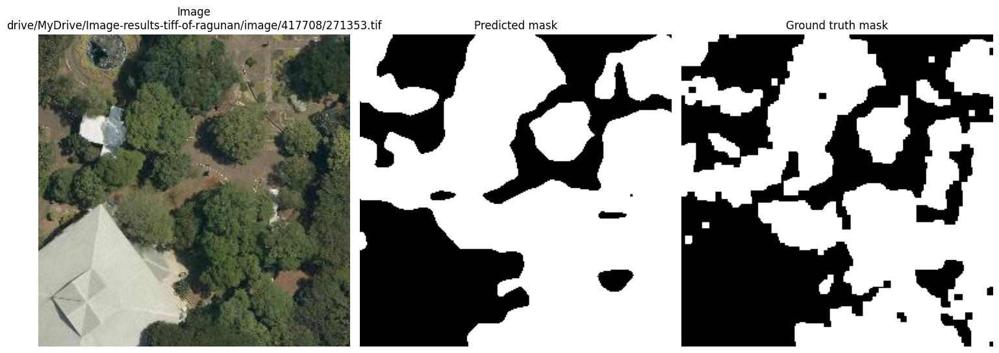

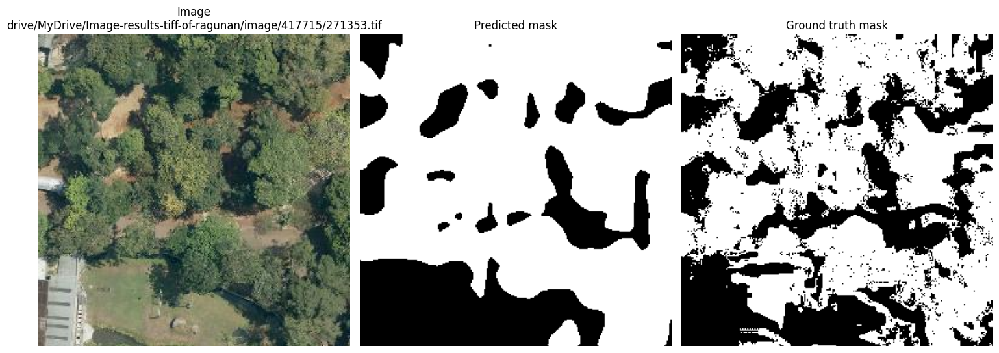

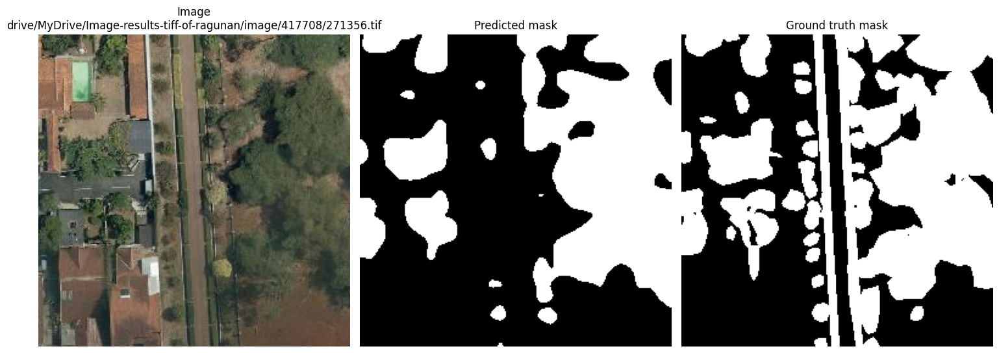

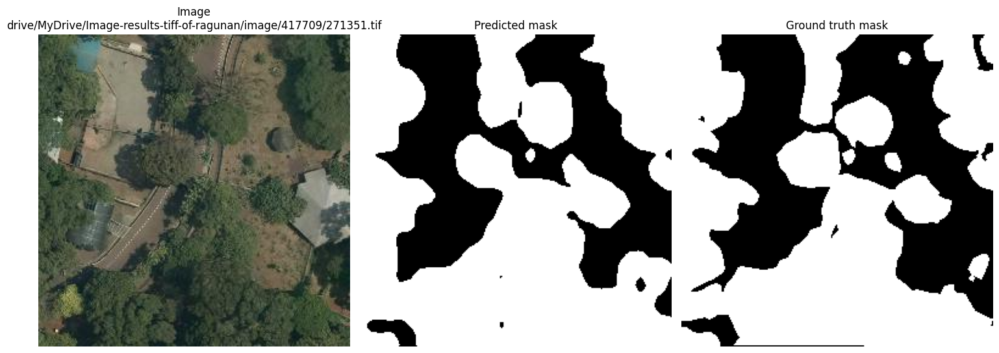

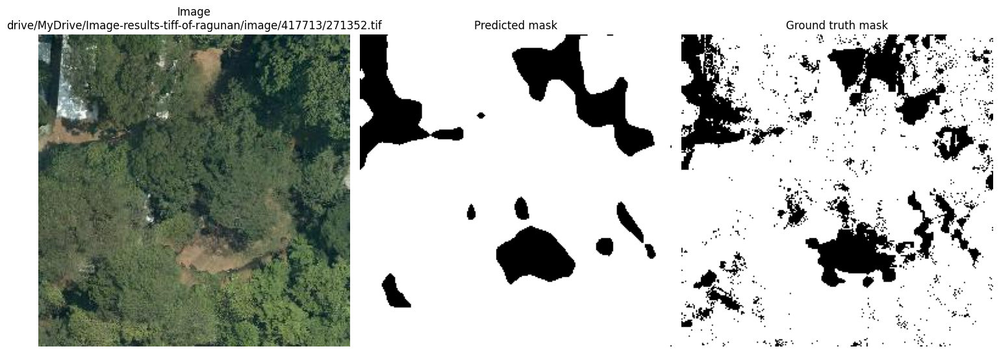

...

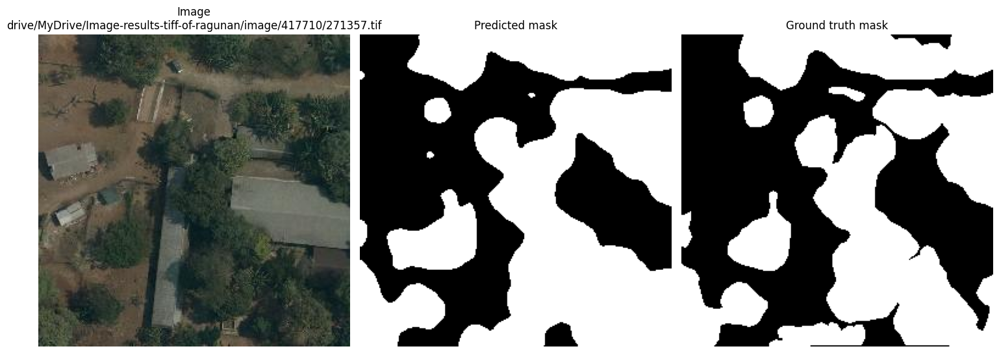

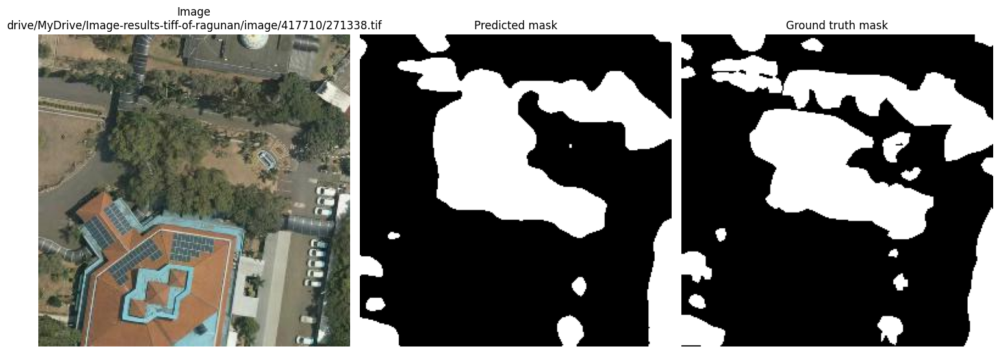

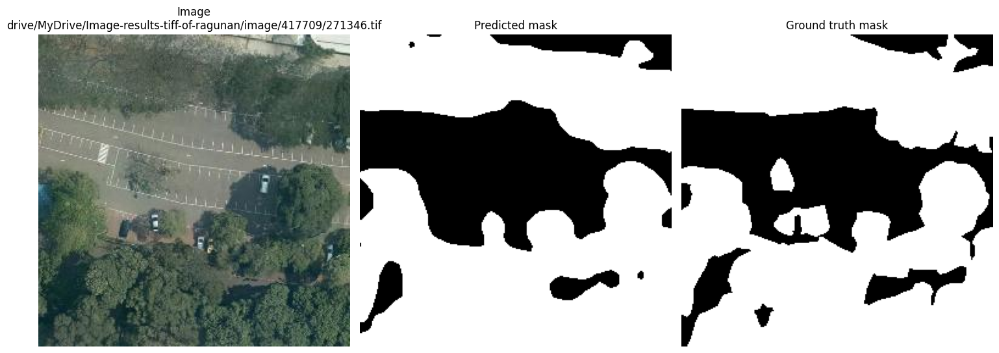

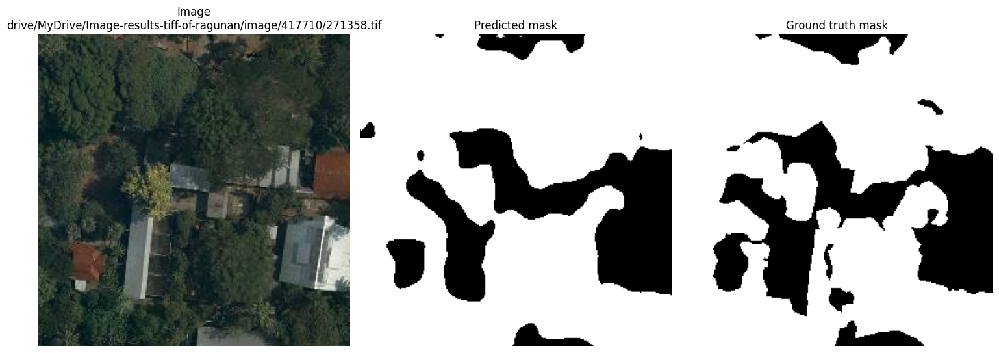

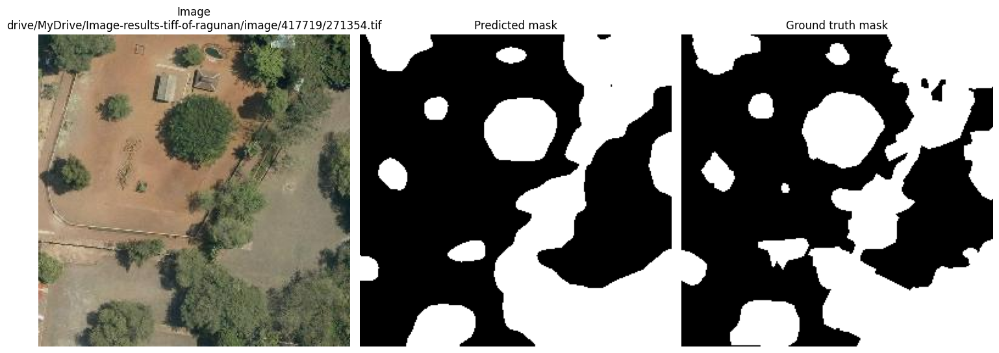

In [32]:
pred_masks = []
gt_masks = []
image_paths = []

with torch.no_grad():
    for image, mask, image_path, mask_path in test_loader:
        image = image.to(device)
        mask = mask.to(device)

        output = fine_tune_model(image)
        output = torch.sigmoid(output)
        pred_mask = (output > 0.5).float()

        for i in range(len(image_path)):
            img = image[i].cpu()
            img_path = image_path[i]

            if img.shape[0] == 1:
                img = img.squeeze(0).numpy()
            elif img.shape[0] == 3:
                img = img.permute(1, 2, 0).numpy()

            gt_mask = mask[i].cpu().squeeze().numpy()
            predicted_mask = pred_mask[i].cpu().squeeze().numpy()

            orig_image = Image.open(img_path).convert("RGB")
            orig_image = np.array(orig_image)

            gt_masks.append(gt_mask)
            pred_masks.append(predicted_mask)
            image_paths.append(img_path)

            plt.figure(figsize = (15, 8))
            plt.subplot(1, 3, 1)
            plt.imshow(orig_image)
            plt.axis("off")
            plt.title(f"Image\n{image_path[i]}")

            plt.subplot(1, 3, 2)
            plt.imshow(predicted_mask, cmap = "gray")
            plt.axis("off")
            plt.title("Predicted mask")

            plt.subplot(1, 3, 3)
            plt.imshow(gt_mask, cmap = "gray")
            plt.axis("off")
            plt.title("Ground truth mask")

            plt.tight_layout()
            plt.show()

In [33]:
def calculate_iou(pred_mask, gt_mask):
    pred_mask_bin = pred_mask > 0
    gt_mask_bin = gt_mask > 0

    intersection = np.logical_and(gt_mask_bin, pred_mask_bin).sum()
    union = np.logical_or(gt_mask_bin, pred_mask_bin).sum()

    if union == 0:
        return 1.0 if intersection == 0 else 0.0

    iou = intersection / union
    return iou

In [34]:
iou_scores = []
total_area = []
images_data = []

for i, img_path in enumerate(image_paths):
    pred_mask = (pred_masks[i] > 0.5).astype(np.uint8)
    gt_mask = (gt_masks[i] > 0.5).astype(np.uint8)

    with rasterio.open(img_path) as src:
        GSD_x, GSD_y = src.res

    pixels = np.sum(pred_mask == 1)
    veg_area = pixels * (GSD_x * GSD_y)
    iou_score = calculate_iou(pred_mask, gt_mask)

    iou_scores.append(iou_score)
    total_area.append(veg_area)

    images_data.append({
        "img_path": img_path,
        "veg_area": veg_area
    })

    print(f"Image {img_path}")
    print(f"GSD x: {GSD_x}")
    print(f"GSD y: {GSD_y}")
    print(f"Pixels: {pixels}")
    print(f"Vegetation coverage area: {veg_area}")
    print(f"IoU score: {iou_score}")
    print("=====================================================")

print("=====================================================")
print(f"Average IoU score: {np.mean(iou_scores)}")
print(f"Total vegetation coverage area: {np.sum(total_area)}")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 41147
Vegetation coverage area: 23158.76242815081
IoU score: 0.8111639525387904
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 46215
Vegetation coverage area: 3591.271974887274
IoU score: 0.7376162401993558
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 24944
Vegetation coverage area: 14039.22934862308
IoU score: 0.6697971117214494
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 41985
Vegetation coverage area: 23630.413895202855
IoU score: 0.8582364813139397
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 55341
Veg

In [37]:
veg_areas = []
carbon_stocks = []

predicted_carbon = 1761.7253514097679

total_veg_area = sum(i["veg_area"] for i in images_data)
carbon_density = predicted_carbon / total_veg_area

for i in images_data:
    carbon_stock = i["veg_area"] * carbon_density
    veg_areas.append(i["veg_area"])
    carbon_stocks.append(carbon_stock)

    print(f"Image {i['img_path']}")
    print(f"Vegetation coverage area: {i['veg_area']} m^2")
    print(f"Carbon density: {carbon_density} ton/m^2")
    print(f"Estimated carbon stock: {carbon_stock} ton")
    print("================================================")

print("================================================")
print(f"Total vegetation coverage area: {total_veg_area} m^2")
print(f"Total carbon density: {carbon_density} ton/m^2")
print(f"Total estimated carbon stock: {sum(carbon_stocks)} ton")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
Vegetation coverage area: 23158.76242815081 m^2
Carbon density: 0.007147934847040457 ton/m^2
Estimated carbon stock: 165.53732497451045 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
Vegetation coverage area: 3591.271974887274 m^2
Carbon density: 0.007147934847040457 ton/m^2
Estimated carbon stock: 25.670178094496546 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
Vegetation coverage area: 14039.22934862308 m^2
Carbon density: 0.007147934847040457 ton/m^2
Estimated carbon stock: 100.351496686616 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
Vegetation coverage area: 23630.413895202855 m^2
Carbon density: 0.007147934847040457 ton/m^2
Estimated carbon stock: 168.9086589315095 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
Vegetation coverage area: 4300.434542080205 m^2
Carbon density: 0.007147